In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re


# import config.yaml file
import yaml
with open("/Users/mmckay/phd_projects/breakBRD/conf/main.yaml", "r") as ymlfile:
    config = yaml.load(ymlfile, Loader=yaml.FullLoader)

In [3]:
def extract_row_values(radial_profile_table_path, col_name, plateifu=None):
    """
    Extract values to a numpy array from a row of the radial profile table.

    radial_profile_table_path: path of radial profile table - check config.yaml
    col_name: column name of the radial profile table
    plateifu: plateifu of the galaxy

    example:
    val_arr = extract_row_values(config['analysis']['bbrd_radial_profiles'], 'HALPHA', plateifu='11758-1901')
    """
    radial_profile_table_df = pd.read_csv(radial_profile_table_path)
    # val_arr = radial_profile_table_df.iloc[0][col_name]
    val_arr = radial_profile_table_df[radial_profile_table_df['plateifu']
                                      == plateifu][col_name].values[0]
    try:
        val_arr = re.sub(r"[\([{})\]]", "", val_arr)
        val_arr = np.fromstring(val_arr, dtype=np.float64, sep=',')
    except TypeError:
        print(f"TypeError: {plateifu} has no value for {col_name}")

    return val_arr


val_arr = extract_row_values(
    config['analysis']['bbrd_radial_profiles'], 'HALPHA', plateifu='11758-1901')
val_arr

array([         nan, 123.1804275 ,  87.99131   ,  53.856199  ,
        28.6635915 ,  18.901531  ,   7.254768  ,   3.9376876 ,
         2.15250375,   1.3035581 ])

In [4]:
pd.read_csv(config['analysis']['bbrd_radial_profiles']).columns

Index(['plateifu', 'Unnamed: 0', 'HALPHA', 'HALPHA KCORR', 'HBETA KCORR',
       'NII6585 KCORR', 'OII3727 KCORR', 'OII3729 KCORR', 'OIII5008 KCORR',
       'SII6718 KCORR', 'SII6732 KCORR', 'HALPHA SNR', 'HBETA SNR',
       'NII6585 SNR', 'OII3727 SNR', 'OII3729 SNR', 'OIII5008 SNR',
       'SII6718 SNR', 'SII6732 SNR', 'HALPHA ERROR', 'HBETA ERROR',
       'NII6585 ERROR', 'OII3727 ERROR', 'OII3729 ERROR', 'OIII5008 ERROR',
       'SII6718 ERROR', 'SII6732 ERROR', 'HALPHA_DQ', 'HA/HB', 'HA_LUM',
       'LOGSFR', 'LOGSFR DENSITY', 'ELLIP R', 'R/REFF', 'LOG(O/H)+12_[N2O2]',
       'LOG(O/H)+12_[O3N2]', 'LOG(O/H)+12_[N2]', 'GYR_LW', 'GYR_MW', 'GYR_ERR',
       'SP_ZSUBL', 'SP_ZSUBM', 'SP_ZERR', 'VEL_KM/S', 'VEL_ERR]', 'VDISP_KM/S',
       'VDISP_ERR', 'M/L', 'MSUN/SPX2', 'MSUN/ARCS2', 'MSUN_ERR', 'D4000',
       'D4000_ERR', 'HDELTA', 'HDELTA_ERR', 'O3HB_RATIO', 'N2HA_RATIO',
       'BPT_CLASS', 'B20_DELTASFR', 'LOG_SIGMA_SSFR', 'B20_SFRD_UPLIM',
       'B20_SFRD_LOWLIM', 'DAP_D4000', '

In [17]:
# fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(
#     2, 3, figsize=(12, 7), constrained_layout=False, dpi=100, sharey='row', sharex='row'
# )
# x_col = 'R/REFF'
# y_col = 'Log_Sigma_sSFR_yr-1'
# bbrd = True
# csf = True
# cgv = True
# cqc = True
# dist_bins = 30
# kde_clip_lim = None
# bbrd_radpro_color = 'magenta'

# if bbrd == True:
#     for plateifu in pd.read_csv(config['data']['11_bbrd_global_table'])['plateifu']:
#         x = extract_row_values(
#             config['analysis']['11_bbrd_radial_profiles'], x_col, plateifu=plateifu)
#         y = extract_row_values(
#             config['analysis']['11_bbrd_radial_profiles'], y_col, plateifu=plateifu)
#         ax0.plot(x, y, color='magenta', zorder=100)
#         ax1.plot(x, y, color='magenta', zorder=100)
#         ax2.plot(x, y, color='magenta', zorder=100)

#     # Density distrubution
#     bbrd_supercsv_df = pd.read_csv(config['data']['bbrd_supercsv'])
#     bbrd_supercsv_df_inner = bbrd_supercsv_df[bbrd_supercsv_df['R/REFF'] < 0.5]
#     bbrd_supercsv_df_outer = bbrd_supercsv_df[bbrd_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]

#     for ax in [ax3, ax4, ax5]:
#         sns.kdeplot(bbrd_supercsv_df_inner[y_col], fill=True, ax=ax,
#                     linewidth=3, alpha=0.2, color=bbrd_radpro_color, linestyle=':',
#                     label=f"BBRD_out N={len(bbrd_supercsv_df_inner[y_col])} $\mu={round(np.mean(bbrd_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(bbrd_supercsv_df_inner[y_col]), 2)}$",
#                     ).set_zorder(100)
#         sns.kdeplot(bbrd_supercsv_df_outer[y_col], fill=True, ax=ax,
#                     linewidth=3, alpha=0.2, color=bbrd_radpro_color, linestyle='-',
#                     label=f"BBRD_out N={len(bbrd_supercsv_df_outer[y_col])} $\mu={round(np.mean(bbrd_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(bbrd_supercsv_df_outer[y_col]), 2)}$",
#                     ).set_zorder(50)

# else:
#     pass

# if csf == True:
#     for plateifu in pd.read_csv(config['data']['csf_global_table'])['plateifu']:
#         x = extract_row_values(
#             config['analysis']['csf_radial_profiles'], x_col, plateifu=plateifu)
#         y = extract_row_values(
#             config['analysis']['csf_radial_profiles'], y_col, plateifu=plateifu)
#         ax0.plot(x, y, color='navy', zorder=0, alpha=0.2)
#     # Density distrubution
#     csf_supercsv_df = pd.read_csv(config['data']['csf_supercsv'])
#     csf_supercsv_df_inner = csf_supercsv_df[csf_supercsv_df['R/REFF'] < 0.5]
#     csf_supercsv_df_outer = csf_supercsv_df[csf_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]

#     sns.kdeplot(csf_supercsv_df_inner[y_col], fill=True, ax=ax3,
#                 linewidth=3, alpha=0.2, color='navy', linestyle=':',
#                 label=f"csf_in N={len(csf_supercsv_df_inner[y_col])} $\mu={round(np.mean(csf_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(csf_supercsv_df_inner[y_col]), 2)}$",
#                 )
#     sns.kdeplot(csf_supercsv_df_outer[y_col], fill=True, ax=ax3,
#                 linewidth=3, alpha=0.2, color='navy', linestyle='-',
#                 label=f"csf_out N={len(csf_supercsv_df_outer[y_col])} $\mu={round(np.mean(csf_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(csf_supercsv_df_outer[y_col]), 2)}$",
#                 )

# else:
#     pass

# if cgv == True:
#     for plateifu in pd.read_csv(config['data']['cgv_global_table'])['plateifu']:
#         if plateifu == '9501-3704':  # Drop file that has 0.0 in GYR_LW
#             pass
#         else:
#             x = extract_row_values(
#                 config['analysis']['cgv_radial_profiles'], x_col, plateifu=plateifu)
#             y = extract_row_values(
#                 config['analysis']['cgv_radial_profiles'], y_col, plateifu=plateifu)
#             ax1.plot(x, y, color='forestgreen', zorder=0, alpha=0.2)

#     cgv_supercsv_df = pd.read_csv(config['data']['cgv_supercsv'])
#     cgv_supercsv_df_inner = cgv_supercsv_df[cgv_supercsv_df['R/REFF'] < 0.5]
#     cgv_supercsv_df_outer = cgv_supercsv_df[cgv_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]
#     sns.kdeplot(cgv_supercsv_df_inner[y_col], fill=True, ax=ax4,
#                 linewidth=3, alpha=0.2, color='forestgreen', linestyle=':',
#                 label=f"cgv_in N={len(cgv_supercsv_df_inner[y_col])} $\mu={round(np.mean(cgv_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(cgv_supercsv_df_inner[y_col]), 2)}$",
#                 )
#     sns.kdeplot(cgv_supercsv_df_outer[y_col], fill=True, ax=ax4,
#                 linewidth=3, alpha=0.2, color='forestgreen', linestyle='-',
#                 label=f"cgv_out N={len(cgv_supercsv_df_outer[y_col])} $\mu={round(np.mean(cgv_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(cgv_supercsv_df_outer[y_col]), 2)}$",
#                 )
# else:
#     pass

# if cqc == True:
#     for plateifu in pd.read_csv(config['data']['cqc_global_table'])['plateifu']:
#         x = extract_row_values(
#             config['analysis']['lg12_radial_profiles'], x_col, plateifu=plateifu)
#         y = extract_row_values(
#             config['analysis']['lg12_radial_profiles'], y_col, plateifu=plateifu)
#         ax2.plot(x, y, color='maroon', zorder=0, alpha=0.2)

#     cqc_supercsv_df = pd.read_csv(config['data']['cqc_supercsv'])
#     cqc_supercsv_df_inner = cqc_supercsv_df[cqc_supercsv_df['R/REFF'] <= 0.5]
#     cqc_supercsv_df_outer = cqc_supercsv_df[cqc_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]
#     sns.kdeplot(cqc_supercsv_df_inner[y_col], fill=True, ax=ax5,
#                 linewidth=3, alpha=0.2, color='maroon', linestyle=':',
#                 label=f"cqc_in N={len(cqc_supercsv_df_inner[y_col])} $\mu={round(np.mean(cqc_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(cqc_supercsv_df_inner[y_col]), 2)}$",
#                 )
#     sns.kdeplot(cqc_supercsv_df_outer[y_col], fill=True, ax=ax5,
#                 linewidth=3, alpha=0.2, color='maroon', linestyle='-',
#                 label=f"cqc_out N={len(cqc_supercsv_df_outer[y_col])} $\mu={round(np.mean(cqc_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(cqc_supercsv_df_outer[y_col]), 2)}$",
#                 )
# else:
#     pass


# # Kernal probability density estimator
# ax3.set_xlim(round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) - 3 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2),
#              round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) + 3 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2))
# for ax in [ax3, ax4, ax5]:
#     ax.legend(fontsize=9, ncol=1, shadow=True, loc="upper center",
#               frameon=True, bbox_to_anchor=(0.5, 1.2))
# plt.tight_layout()

In [6]:
# Apply weights to each gaalxies in a radial bin based on the number of spaxels
# Then takes the average of the bins
def weighted_avg_binning(xdata_str, ydata_str, bins, csv_file_list):

    # Create a new CSV file to store the BreakBRd weights
    num_spx_per_bin_df = pd.DataFrame()
    # Create a CSV to store all the weights and averages of a bin for each galaxy
    weighted_medians_df = pd.DataFrame()

    # TODO Remove from script - fucntion should not do any data removal
    for csv_file_path in csv_file_list:
        # Remove the merger and AGN galaxy from the Combo csv file and adds AGn to there own csv
        # if (csv_file_path == f"/Users/mmckay/Desktop/research/FMR_MZR/bbrd_MMfits/9183-3703_map.csv"
        # print(csv_file_path.split("/")[-1])
        if (
            csv_file_path.split("/")[-1] == "9183-3703_map.csv"
            or csv_file_path.split("/")[-1] == "11827-1902_map.csv"
            or csv_file_path.split("/")[-1] == "8595-3703_map.csv"
        ):
            pass

        else:
            # # print(csv_file_path)
            ifu_csv_df = pd.read_csv(csv_file_path)
            pass

            # Copy the combo csv to drop nan values but keep the combo_df from changing
            bbrd_combo_cp_df = ifu_csv_df.copy()

            # Read in x and y data
            xdata = bbrd_combo_cp_df[xdata_str]
            ydata = bbrd_combo_cp_df[ydata_str]

            # ydata_percentile

            # Start binning
            digitized = np.digitize(xdata, bins)

            # Empty list to store weights  and weights*avg values
            ydata_bin_weight = []
            ydata_w_avg_per_bin = []
            ydata_16quartile_list = []
            ydata_84quartile_list = []

            for i in range(1, len(bins)):
                ydata_bin_spax = ydata[digitized == i]
                ydata_bin_weight.append(len(ydata_bin_spax))
                # print(np.mean(ydata_bin_spax), len(ydata_bin_spax))
                ydata_w_avg_per_bin.append(
                    np.nanmedian(ydata_bin_spax) * len(ydata_bin_spax)
                )

            # Appends weights to a dataframe
            num_spx_per_bin_df[csv_file_path[-19:]] = ydata_bin_weight
            weighted_medians_df[csv_file_path[-19:]] = ydata_w_avg_per_bin

    # Adds the total number of spaxels in a bin (Denominator)
    num_spx_per_bin_df["Total # spaxels in bin"] = num_spx_per_bin_df.sum(
        axis=1)

    # Sums of all the weights (Numerator)
    # weighted_medians_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    weighted_medians_df["Sum of w*avg in bin"] = weighted_medians_df.sum(
        axis=1)

    # weighted_average radial profile FWM = SUM(Median * weight) / Total
    freq_weighted_ydata = (
        weighted_medians_df["Sum of w*avg in bin"]
        / num_spx_per_bin_df["Total # spaxels in bin"]
    )

    # Add values to weighted averagedb dataframe
    weighted_medians_df[f"TOTAL_spx_in_bin{ydata_str}"] = num_spx_per_bin_df["Total # spaxels in bin"]
    weighted_medians_df[f"FWbinned_y_{ydata_str}"] = freq_weighted_ydata
    # weighted_medians_df[f"FWbinned_x_{xdata_str}"] = np.linspace(0.01, 2.0, 11)

    return (
        freq_weighted_ydata,
        num_spx_per_bin_df,
        weighted_medians_df,
    )


# Test function
# lg12_csv_list = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/lg12_MMfits/*_map.csv")
# lg12_binned_xdata, lg12_ydata_w_avgs, lg12_weight_df, lg12_weighted_avgs_df = weighted_avg_binning(xdata_str='R/REFF', ydata_str='LOGSFR DENSITY', bins=np.linspace(0, 1.8, 12), csv_file_list=lg12_csv_list)
# lg12_weighted_avgs_df.head(14)

In [7]:
import glob
csv_list = glob.glob(
    "/Users/mmckay/phd_projects/breakBRD/DATA/IFU_CSVs/BBRD_CSVs/*_map.csv")
ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
    xdata_str='R/REFF', ydata_str='LOGSFR DENSITY', bins=np.linspace(0.01, 2.0, 11), csv_file_list=csv_list)
freq_weighted_med_df.head(14)

/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

,/12094-1901_map.csv,/10217-6103_map.csv,/11758-1901_map.csv,s/9894-3703_map.csv,s/8565-1902_map.csv,s/8254-1902_map.csv,s/8465-9102_map.csv,/8550-12703_map.csv,/11760-1902_map.csv,/10001-3702_map.csv,/8312-12704_map.csv,Sum of w*avg in bin,TOTAL_spx_in_binLOGSFR DENSITY,FWbinned_y_LOGSFR DENSITY
0,-4.428599,-5.324403,NaN,-3.916728,NaN,NaN,-25.030878,-39.197955,NaN,-5.611979,-36.216712,-119.727254,111,-1.078624
1,-14.268591,-14.735610,-4.373458,-17.779718,-6.439554,-5.919659,-128.822790,-192.229228,-2.435983,-26.116057,-165.705974,-578.826623,375,-1.543538
2,-29.706488,-33.312252,-8.370907,-33.394684,-11.712798,-10.149592,-300.177185,-373.232607,-2.723988,-53.655389,-307.364743,-1163.800631,565,-2.059824
3,-46.402478,-61.176291,-14.297114,-74.512865,-17.586573,-22.698646,-520.905871,-456.815402,-9.550369,-112.371926,-360.077696,-1696.395231,742,-2.286247
4,-61.088660,-97.831565,-16.588372,-142.228672,-21.001167,-30.449325,-782.151634,-668.267143,-5.569001,-158.583247,-730.306582,-2714.065368,939,-2.890378
5,-109.181621,-165.397466,-18.219880,-201.652921,-44.759668,-39.294169,-1116.065992,-1170.205922,-13.909567,-238.396281,-781.455310,-3898.538795,1108,-3.518537
6,-154.476549,-206.463849,-37.421615,-283.028944,-60.091501,-59.991373,-1284.271311,-1443.263500,-18.776055,-360.424519,-235.178970,-4143.388187,1094,-3.787375
7,-207.893113,-245.655072,-68.530698,-301.279979,-90.590802,-72.805267,-1239.038972,-1316.167815,-18.267293,-370.611084,NaN,-3930.840095,972,-4.044074
8,-169.402952,-235.947231,-81.677851,-283.544490,-100.933706,-109.909574,-335.685395,-678.272202,-33.522321,-207.310825,NaN,-2236.206550,569,-3.930064
9,-49.530443,-160.332951,-88.370989,-135.911164,-114.860654,-129.769299,NaN,-123.234152,-26.376852,-35.222572,NaN,-863.609076,253,-3.413475


In [8]:
freq_weighted_med_df['TOTAL_spx_in_binLOGSFR DENSITY'].sum()

6728

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for Unnamed: 0
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for Unnamed: 0
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for Unnamed: 0
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for Unnamed: 0


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mmckay/conda/envs/astrococnda3_10/lib/

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HBETA KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HBETA KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HBETA KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HBETA KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for NII6585 KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for NII6585 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for NII6585 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for NII6585 KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3727 KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3727 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3727 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3727 KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3729 KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3729 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3729 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3729 KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OIII5008 KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OIII5008 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OIII5008 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OIII5008 KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6718 KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6718 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6718 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6718 KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6732 KCORR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6732 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6732 KCORR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6732 KCORR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HBETA SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HBETA SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HBETA SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HBETA SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for NII6585 SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for NII6585 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for NII6585 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for NII6585 SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3727 SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3727 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3727 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3727 SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3729 SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3729 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3729 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3729 SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OIII5008 SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OIII5008 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OIII5008 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OIII5008 SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6718 SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6718 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6718 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6718 SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6732 SNR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6732 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6732 SNR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6732 SNR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HBETA ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HBETA ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HBETA ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HBETA ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for NII6585 ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for NII6585 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for NII6585 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for NII6585 ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3727 ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3727 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3727 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3727 ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3729 ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OII3729 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3729 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OII3729 ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OIII5008 ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for OIII5008 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OIII5008 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for OIII5008 ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6718 ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6718 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6718 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6718 ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6732 ERROR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SII6732 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6732 ERROR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SII6732 ERROR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA_DQ
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HALPHA_DQ
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA_DQ
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HALPHA_DQ


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/var/folders/41/1_71sw_13ql14yq5j387scf80000gn/T/ipykernel_49088/135071360.py:121: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  ax0.set_ylim(round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) - 4 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2),
/var/folders/41/1_71sw_13ql14yq5j387scf80000gn/T/ipykernel_49088/135071360.py:123: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformat

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HA/HB
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HA/HB
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HA/HB
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HA/HB


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HA_LUM
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HA_LUM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HA_LUM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HA_LUM


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOGSFR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOGSFR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOGSFR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOGSFR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOGSFR DENSITY
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOGSFR DENSITY
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOGSFR DENSITY
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOGSFR DENSITY


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for ELLIP R
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for ELLIP R
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for ELLIP R
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for ELLIP R


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for R/REFF
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for R/REFF


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG(O/H)+12_[N2O2]
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG(O/H)+12_[N2O2]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG(O/H)+12_[N2O2]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG(O/H)+12_[N2O2]


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG(O/H)+12_[O3N2]
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG(O/H)+12_[O3N2]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG(O/H)+12_[O3N2]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG(O/H)+12_[O3N2]


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG(O/H)+12_[N2]
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG(O/H)+12_[N2]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG(O/H)+12_[N2]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG(O/H)+12_[N2]


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GYR_LW
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GYR_LW
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GYR_LW
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GYR_LW


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GYR_MW
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GYR_MW
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GYR_MW
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GYR_MW


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GYR_ERR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GYR_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GYR_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GYR_ERR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SP_ZSUBL
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SP_ZSUBL
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SP_ZSUBL
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SP_ZSUBL


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SP_ZSUBM
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SP_ZSUBM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SP_ZSUBM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SP_ZSUBM


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SP_ZERR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for SP_ZERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SP_ZERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for SP_ZERR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VEL_KM/S
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VEL_KM/S
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VEL_KM/S
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VEL_KM/S


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VEL_ERR]
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VEL_ERR]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VEL_ERR]
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VEL_ERR]


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VDISP_KM/S
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VDISP_KM/S
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VDISP_KM/S
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VDISP_KM/S


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VDISP_ERR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for VDISP_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VDISP_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for VDISP_ERR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for M/L
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for M/L
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for M/L
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for M/L


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for MSUN/SPX2
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for MSUN/SPX2
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for MSUN/SPX2
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for MSUN/SPX2


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for MSUN/ARCS2
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for MSUN/ARCS2
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for MSUN/ARCS2
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for MSUN/ARCS2


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for MSUN_ERR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for MSUN_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for MSUN_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for MSUN_ERR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for D4000
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for D4000
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for D4000
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for D4000


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for D4000_ERR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for D4000_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for D4000_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for D4000_ERR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HDELTA
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HDELTA
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HDELTA
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HDELTA


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HDELTA_ERR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for HDELTA_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HDELTA_ERR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for HDELTA_ERR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for O3HB_RATIO
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for O3HB_RATIO
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for O3HB_RATIO
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for O3HB_RATIO


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for N2HA_RATIO
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for N2HA_RATIO
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for N2HA_RATIO
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for N2HA_RATIO


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for BPT_CLASS
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for BPT_CLASS
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for BPT_CLASS
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for BPT_CLASS


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for B20_DELTASFR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for B20_DELTASFR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for B20_DELTASFR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for B20_DELTASFR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG_SIGMA_SSFR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for LOG_SIGMA_SSFR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG_SIGMA_SSFR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for LOG_SIGMA_SSFR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for B20_SFRD_UPLIM
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for B20_SFRD_UPLIM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for B20_SFRD_UPLIM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for B20_SFRD_UPLIM


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for B20_SFRD_LOWLIM
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for B20_SFRD_LOWLIM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for B20_SFRD_LOWLIM
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for B20_SFRD_LOWLIM


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_D4000
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_D4000
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_D4000
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_D4000


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_DN4000
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_DN4000
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_DN4000
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_DN4000


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAA
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAA
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAA
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAA


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAF
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAF
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAF
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAF


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_D4000_IVAR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_D4000_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_D4000_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_D4000_IVAR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_DN4000_IVAR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_DN4000_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_DN4000_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_DN4000_IVAR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAA_IVAR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAA_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAA_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAA_IVAR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAF_IVAR
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for DAP_HDELTAF_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAF_IVAR
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for DAP_HDELTAF_IVAR


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for R_KPC
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for R_KPC
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for R_KPC
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for R_KPC


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GASVEL_DISP
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GASVEL_DISP
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GASVEL_DISP
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GASVEL_DISP


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GASVEL_ERR_DISP
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for GASVEL_ERR_DISP
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GASVEL_ERR_DISP
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for GASVEL_ERR_DISP


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for STARVEL_DISP1
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for STARVEL_DISP1
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for STARVEL_DISP1
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for STARVEL_DISP1


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for STARVEL_DISP2
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for STARVEL_DISP2
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for STARVEL_DISP2
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for STARVEL_DISP2


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for Log_Sigma_sSFR_yr-1
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for Log_Sigma_sSFR_yr-1
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for Log_Sigma_sSFR_yr-1
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for Log_Sigma_sSFR_yr-1


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

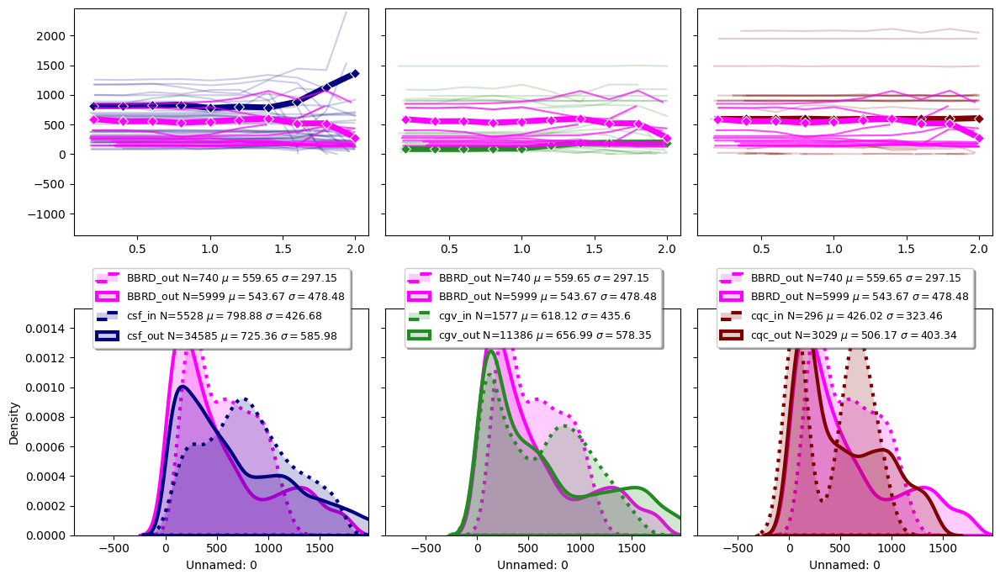

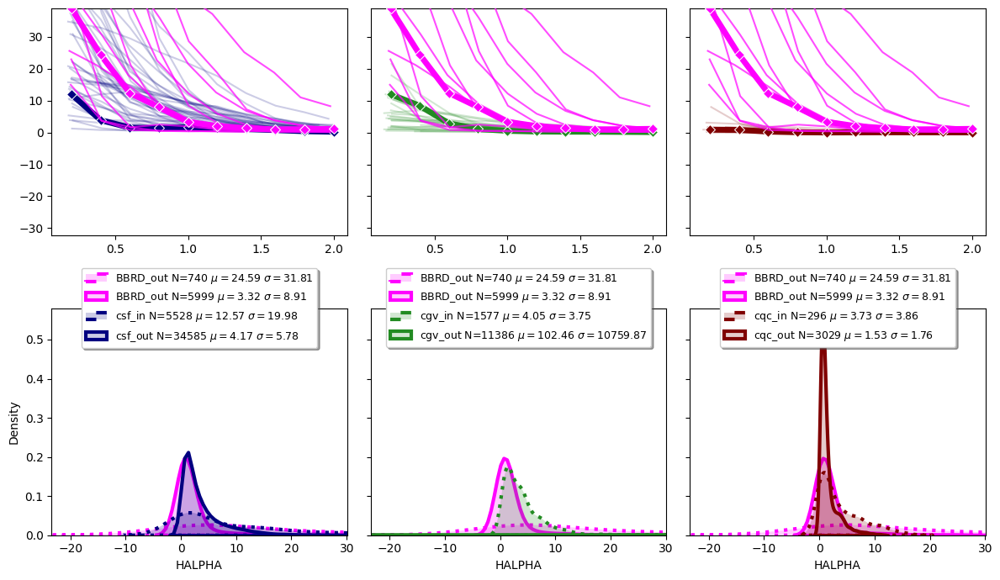

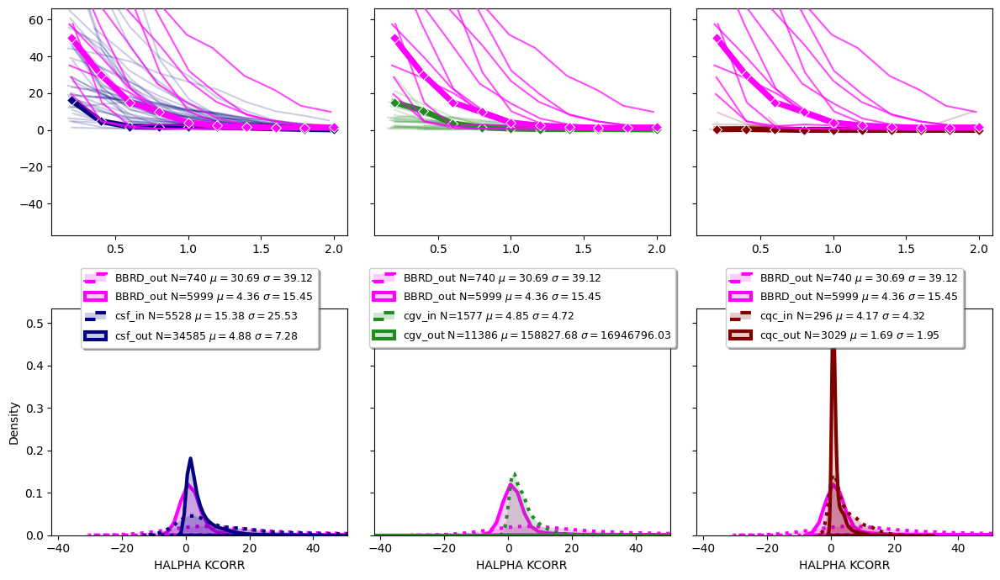

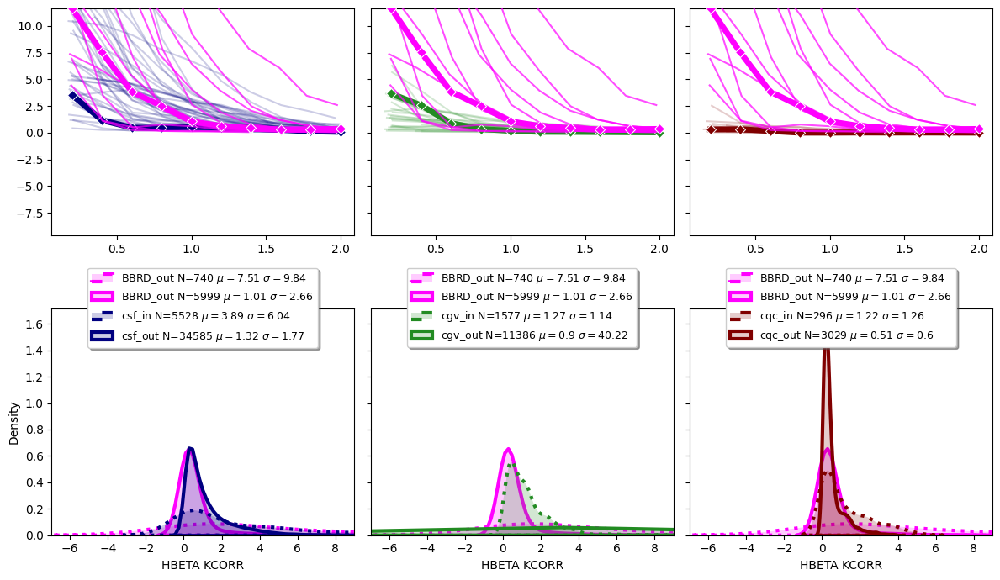

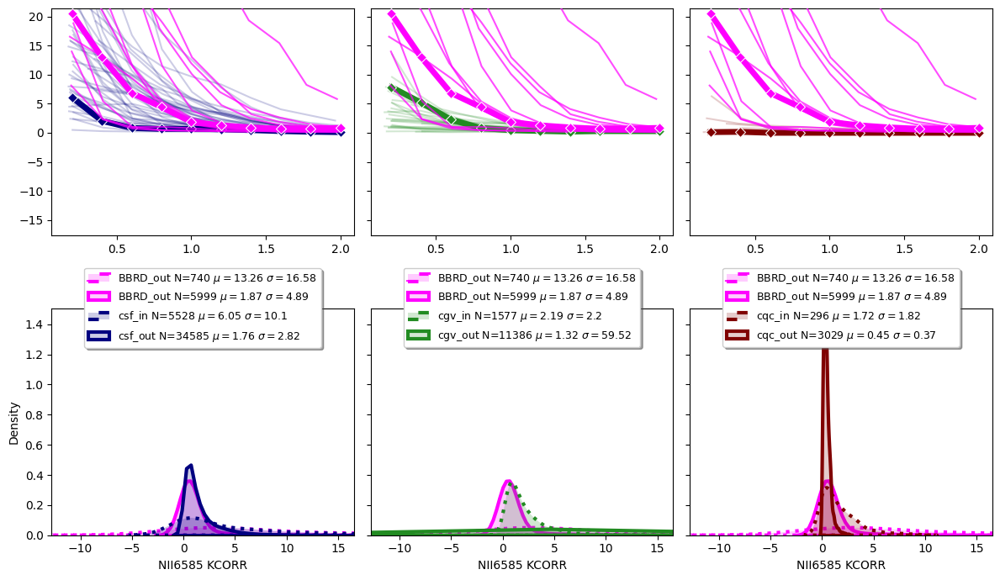

...

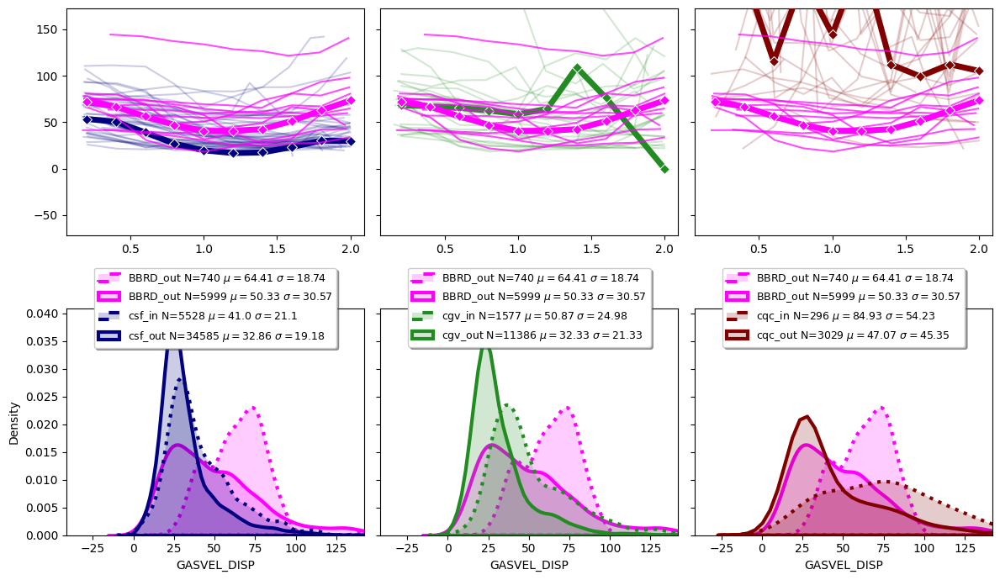

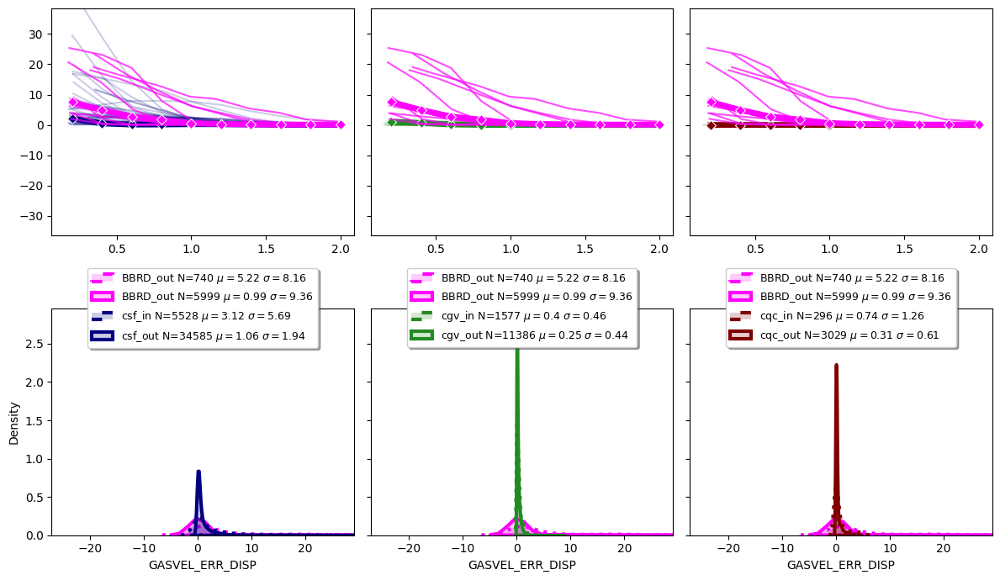

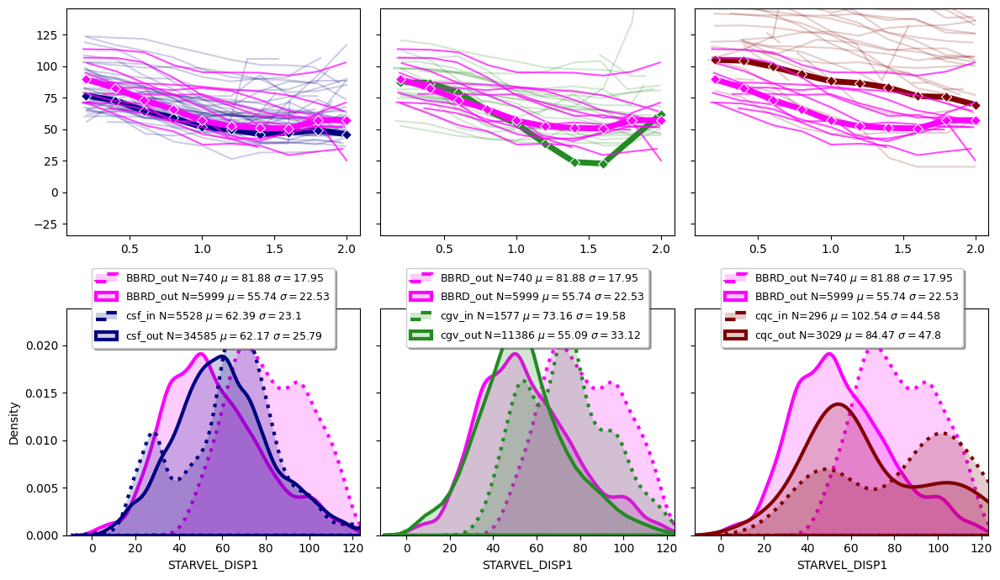

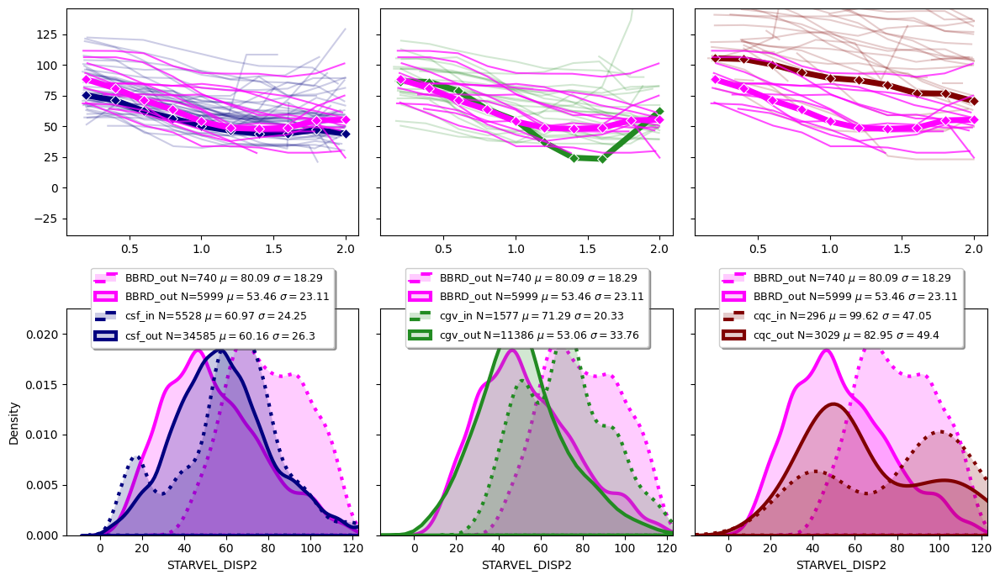

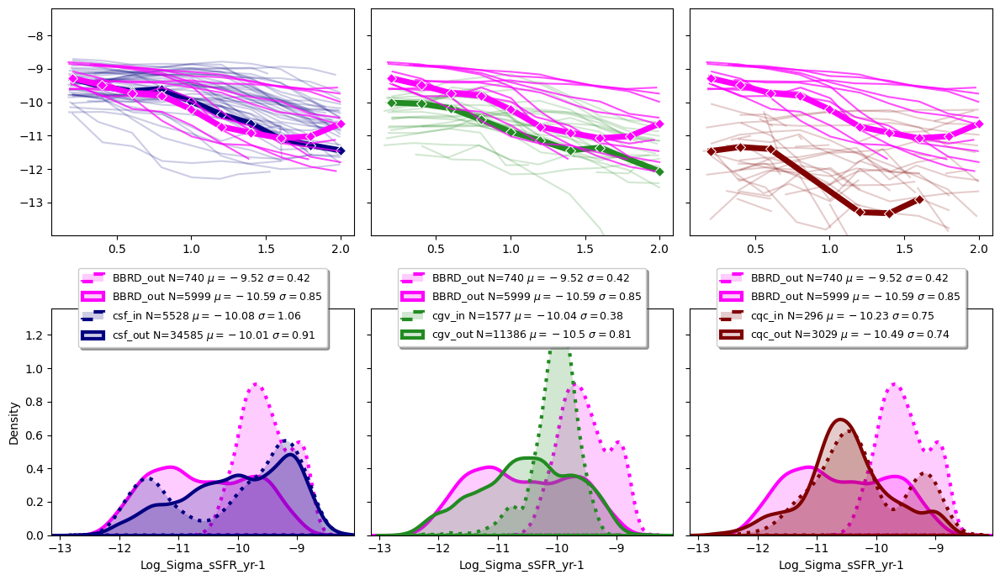

In [16]:
def plot_radial_profile(x_col='R/REFF', y_col='Log_Sigma_sSFR_yr-1', bbrd=True, csf=True, cgv=True, cqc=True, dist_bins=30, kde_clip_lim=None, saveplot=False):
    fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(
        2, 3, figsize=(12, 7), constrained_layout=False, dpi=100, sharey='row', sharex='row'
    )

    #! BBRD =================================================================
    bbrd_ifu_csv_list = []
    if bbrd == True:
        for plateifu in pd.read_csv(config['data']['11_bbrd_global_table'])['plateifu']:
            x = extract_row_values(
                config['analysis']['11_bbrd_radial_profiles'], x_col, plateifu=plateifu)
            y = extract_row_values(
                config['analysis']['11_bbrd_radial_profiles'], y_col, plateifu=plateifu)
            ax0.plot(x, y, color='magenta', alpha=0.7, zorder=100)
            ax1.plot(x, y, color='magenta', alpha=0.7, zorder=100)
            ax2.plot(x, y, color='magenta', alpha=0.7, zorder=100)

            # * List of CSV files bing used for plotting and making the freq weighted median
            all_ifucsv_path = config['data']['all_csv_dir']
            bbrd_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')

        # Density distrubution
        bbrd_supercsv_df = pd.read_csv(config['data']['bbrd_supercsv'])
        bbrd_supercsv_df_inner = bbrd_supercsv_df[bbrd_supercsv_df['R/REFF'] < 0.5]
        bbrd_supercsv_df_outer = bbrd_supercsv_df[bbrd_supercsv_df['R/REFF'].between(
            0.5, 2.0)]

        for ax in [ax3, ax4, ax5]:
            sns.kdeplot(bbrd_supercsv_df_inner[y_col], fill=True, ax=ax,
                        linewidth=3, alpha=0.2, color='magenta', linestyle=':',
                        label=f"BBRD_out N={len(bbrd_supercsv_df_inner[y_col])} $\mu={round(np.mean(bbrd_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(bbrd_supercsv_df_inner[y_col]), 2)}$",
                        ).set_zorder(100)
            sns.kdeplot(bbrd_supercsv_df_outer[y_col], fill=True, ax=ax,
                        linewidth=3, alpha=0.2, color='magenta', linestyle='-',
                        label=f"BBRD_out N={len(bbrd_supercsv_df_outer[y_col])} $\mu={round(np.mean(bbrd_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(bbrd_supercsv_df_outer[y_col]), 2)}$",
                        ).set_zorder(50)

    else:
        pass

    csf_ifu_csv_list = []
    if csf == True:
        for plateifu in pd.read_csv(config['data']['csf_global_table'])['plateifu']:
            x = extract_row_values(
                config['analysis']['csf_radial_profiles'], x_col, plateifu=plateifu)
            y = extract_row_values(
                config['analysis']['csf_radial_profiles'], y_col, plateifu=plateifu)
            ax0.plot(x, y, color='navy', zorder=0, alpha=0.2)
        csf_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')

        # Density distrubution
        csf_supercsv_df = pd.read_csv(config['data']['csf_supercsv'])
        csf_supercsv_df_inner = csf_supercsv_df[csf_supercsv_df['R/REFF'] < 0.5]
        csf_supercsv_df_outer = csf_supercsv_df[csf_supercsv_df['R/REFF'].between(
            0.5, 2.0)]

        sns.kdeplot(csf_supercsv_df_inner[y_col], fill=True, ax=ax3,
                    linewidth=3, alpha=0.2, color='navy', linestyle=':',
                    label=f"csf_in N={len(csf_supercsv_df_inner[y_col])} $\mu={round(np.mean(csf_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(csf_supercsv_df_inner[y_col]), 2)}$",
                    )
        sns.kdeplot(csf_supercsv_df_outer[y_col], fill=True, ax=ax3,
                    linewidth=3, alpha=0.2, color='navy', linestyle='-',
                    label=f"csf_out N={len(csf_supercsv_df_outer[y_col])} $\mu={round(np.mean(csf_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(csf_supercsv_df_outer[y_col]), 2)}$",
                    )

    else:
        pass
    cgv_ifu_csv_list = []
    if cgv == True:
        for plateifu in pd.read_csv(config['data']['cgv_global_table'])['plateifu']:
            if plateifu == '9501-3704':  # Drop file that has 0.0 in GYR_LW
                pass
            else:
                x = extract_row_values(
                    config['analysis']['cgv_radial_profiles'], x_col, plateifu=plateifu)
                y = extract_row_values(
                    config['analysis']['cgv_radial_profiles'], y_col, plateifu=plateifu)
                ax1.plot(x, y, color='forestgreen', zorder=0, alpha=0.2)

        cgv_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')
        cgv_supercsv_df = pd.read_csv(config['data']['cgv_supercsv'])
        cgv_supercsv_df_inner = cgv_supercsv_df[cgv_supercsv_df['R/REFF'] < 0.5]
        cgv_supercsv_df_outer = cgv_supercsv_df[cgv_supercsv_df['R/REFF'].between(
            0.5, 2.0)]
        sns.kdeplot(cgv_supercsv_df_inner[y_col], fill=True, ax=ax4,
                    linewidth=3, alpha=0.2, color='forestgreen', linestyle=':',
                    label=f"cgv_in N={len(cgv_supercsv_df_inner[y_col])} $\mu={round(np.mean(cgv_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(cgv_supercsv_df_inner[y_col]), 2)}$",
                    )
        sns.kdeplot(cgv_supercsv_df_outer[y_col], fill=True, ax=ax4,
                    linewidth=3, alpha=0.2, color='forestgreen', linestyle='-',
                    label=f"cgv_out N={len(cgv_supercsv_df_outer[y_col])} $\mu={round(np.mean(cgv_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(cgv_supercsv_df_outer[y_col]), 2)}$",
                    )
    else:
        pass
    cqc_ifu_csv_list = []
    if cqc == True:
        for plateifu in pd.read_csv(config['data']['cqc_global_table'])['plateifu']:
            x = extract_row_values(
                config['analysis']['lg12_radial_profiles'], x_col, plateifu=plateifu)
            y = extract_row_values(
                config['analysis']['lg12_radial_profiles'], y_col, plateifu=plateifu)
            ax2.plot(x, y, color='maroon', zorder=0, alpha=0.2)

        cqc_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')
        cqc_supercsv_df = pd.read_csv(config['data']['cqc_supercsv'])
        cqc_supercsv_df_inner = cqc_supercsv_df[cqc_supercsv_df['R/REFF'] <= 0.5]
        cqc_supercsv_df_outer = cqc_supercsv_df[cqc_supercsv_df['R/REFF'].between(
            0.5, 2.0)]
        sns.kdeplot(cqc_supercsv_df_inner[y_col], fill=True, ax=ax5,
                    linewidth=3, alpha=0.2, color='maroon', linestyle=':',
                    label=f"cqc_in N={len(cqc_supercsv_df_inner[y_col])} $\mu={round(np.mean(cqc_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(cqc_supercsv_df_inner[y_col]), 2)}$",
                    )
        sns.kdeplot(cqc_supercsv_df_outer[y_col], fill=True, ax=ax5,
                    linewidth=3, alpha=0.2, color='maroon', linestyle='-',
                    label=f"cqc_out N={len(cqc_supercsv_df_outer[y_col])} $\mu={round(np.mean(cqc_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(cqc_supercsv_df_outer[y_col]), 2)}$",
                    )
    else:
        pass

    # Kernal probability density estimator
    ax0.set_ylim(round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) - 4 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2),
                 round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) + 4 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2))
    ax3.set_xlim(round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) - 3 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2),
                 round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) + 3 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2))
    for ax in [ax3, ax4, ax5]:
        ax.legend(fontsize=9, ncol=1, shadow=True, loc="upper center",
                  frameon=True, bbox_to_anchor=(0.5, 1.2))

    # * BBRD freq weighted median
    x = np.linspace(0.2, 2.0, 10)
    ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
        xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=bbrd_ifu_csv_list)
    sns.lineplot(x, ydata_wt_med, color='magenta',
                 zorder=100, linewidth=5, marker='D', ax=ax0)
    sns.lineplot(x, ydata_wt_med, color='magenta',
                 zorder=100, linewidth=5, marker='D', ax=ax1)
    sns.lineplot(x, ydata_wt_med, color='magenta',
                 zorder=100, linewidth=5, marker='D', ax=ax2)

    # CSF
    ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
        xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=csf_ifu_csv_list)
    sns.lineplot(x, ydata_wt_med, color='navy', zorder=90,
                 linewidth=5, marker='D', ax=ax0)
    plt.tight_layout()

    # CGV
    ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
        xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=cgv_ifu_csv_list)
    sns.lineplot(x, ydata_wt_med, color='forestgreen',
                 zorder=90, linewidth=5, marker='D', ax=ax1)
    plt.tight_layout()

    # CQC
    ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
        xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=cqc_ifu_csv_list)
    sns.lineplot(x, ydata_wt_med, color='maroon',
                 zorder=90, linewidth=5, marker='D', ax=ax2)
    plt.tight_layout()

    if saveplot == True:
        y_col = re.sub('[^a-zA-Z0-9 \n\.]', "", y_col)
        plt.savefig(f'{config["plots"]["plot_dir"]}_{y_col}.pdf', dpi=150)
        # if y_col == "HA/HB":
        #     plt.savefig(f'{config["plots"]["plot_dir"]}_HA_HB.pdf', dpi=150)
        # else:
        # plt.savefig(f'{config["plots"]["plot_dir"]}_{y_col}.pdf', dpi=150)
        # plt.show()


df = pd.read_csv(config["data"]["bbrd_supercsv"])
numeric_columns = df.select_dtypes(include=["float", "int"]).columns
for y_col in numeric_columns:
    plot_radial_profile(x_col='R/REFF', y_col=y_col, bbrd=True, csf=True,
                        cgv=True, cqc=True, dist_bins=30, kde_clip_lim=None, saveplot=True)

In [ ]:
numeric_columns

Index(['Unnamed: 0', 'HALPHA', 'HALPHA KCORR', 'HBETA KCORR', 'NII6585 KCORR',
       'OII3727 KCORR', 'OII3729 KCORR', 'OIII5008 KCORR', 'SII6718 KCORR',
       'SII6732 KCORR', 'HALPHA SNR', 'HBETA SNR', 'NII6585 SNR',
       'OII3727 SNR', 'OII3729 SNR', 'OIII5008 SNR', 'SII6718 SNR',
       'SII6732 SNR', 'HALPHA ERROR', 'HBETA ERROR', 'NII6585 ERROR',
       'OII3727 ERROR', 'OII3729 ERROR', 'OIII5008 ERROR', 'SII6718 ERROR',
       'SII6732 ERROR', 'HALPHA_DQ', 'HA/HB', 'HA_LUM', 'LOGSFR',
       'LOGSFR DENSITY', 'ELLIP R', 'R/REFF', 'LOG(O/H)+12_[N2O2]',
       'LOG(O/H)+12_[O3N2]', 'LOG(O/H)+12_[N2]', 'GYR_LW', 'GYR_MW', 'GYR_ERR',
       'SP_ZSUBL', 'SP_ZSUBM', 'SP_ZERR', 'VEL_KM/S', 'VEL_ERR]', 'VDISP_KM/S',
       'VDISP_ERR', 'M/L', 'MSUN/SPX2', 'MSUN/ARCS2', 'MSUN_ERR', 'D4000',
       'D4000_ERR', 'HDELTA', 'HDELTA_ERR', 'O3HB_RATIO', 'N2HA_RATIO',
       'BPT_CLASS', 'B20_DELTASFR', 'LOG_SIGMA_SSFR', 'B20_SFRD_UPLIM',
       'B20_SFRD_LOWLIM', 'DAP_D4000', 'DAP_DN4000',

In [15]:

for i in numeric_columns:
    i = re.sub('[^a-zA-Z0-9 \n\.]', "", i)
    print(i)
    # print(i.replace("!@#$%^&*()[]{};:,./<>?\|`~-=+", "_"))

Unnamed 0
HALPHA
HALPHA KCORR
HBETA KCORR
NII6585 KCORR
OII3727 KCORR
OII3729 KCORR
OIII5008 KCORR
SII6718 KCORR
SII6732 KCORR
HALPHA SNR
HBETA SNR
NII6585 SNR
OII3727 SNR
OII3729 SNR
OIII5008 SNR
SII6718 SNR
SII6732 SNR
HALPHA ERROR
HBETA ERROR
NII6585 ERROR
OII3727 ERROR
OII3729 ERROR
OIII5008 ERROR
SII6718 ERROR
SII6732 ERROR
HALPHADQ
HAHB
HALUM
LOGSFR
LOGSFR DENSITY
ELLIP R
RREFF
LOGOH12N2O2
LOGOH12O3N2
LOGOH12N2
GYRLW
GYRMW
GYRERR
SPZSUBL
SPZSUBM
SPZERR
VELKMS
VELERR
VDISPKMS
VDISPERR
ML
MSUNSPX2
MSUNARCS2
MSUNERR
D4000
D4000ERR
HDELTA
HDELTAERR
O3HBRATIO
N2HARATIO
BPTCLASS
B20DELTASFR
LOGSIGMASSFR
B20SFRDUPLIM
B20SFRDLOWLIM
DAPD4000
DAPDN4000
DAPHDELTAA
DAPHDELTAF
DAPD4000IVAR
DAPDN4000IVAR
DAPHDELTAAIVAR
DAPHDELTAFIVAR
RKPC
GASVELDISP
GASVELERRDISP
STARVELDISP1
STARVELDISP2
LogSigmasSFRyr1


TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for Log_Sigma_sSFR_yr-1
TypeError: 7979-12703 has no value for R/REFF
TypeError: 7979-12703 has no value for Log_Sigma_sSFR_yr-1
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for Log_Sigma_sSFR_yr-1
TypeError: 8328-12704 has no value for R/REFF
TypeError: 8328-12704 has no value for Log_Sigma_sSFR_yr-1


/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astrococnda3_10/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/mmckay/conda/envs/astro

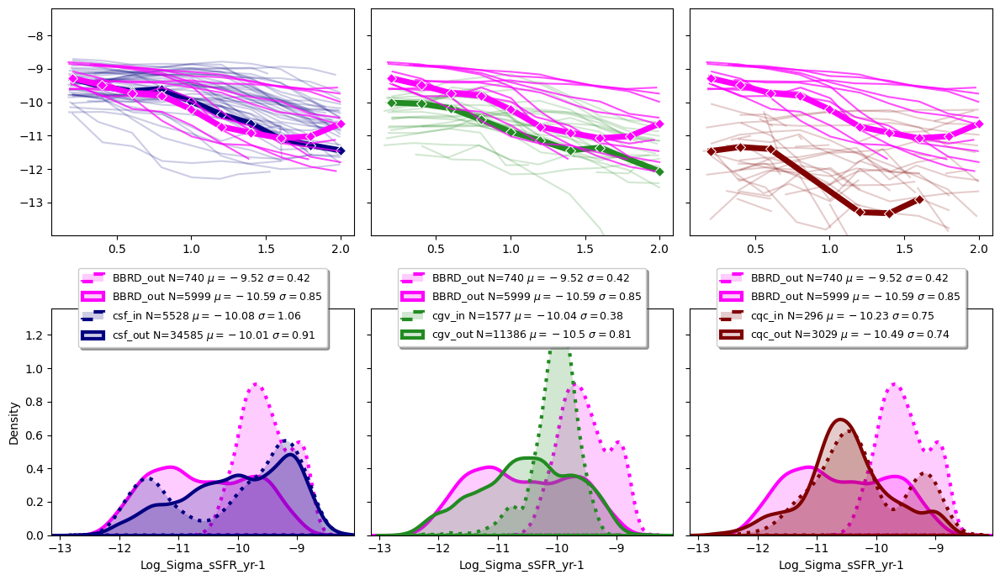

In [160]:
# fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(
#     2, 3, figsize=(12, 7), constrained_layout=False, dpi=100, sharey='row', sharex='row'
# )
# x_col = 'R/REFF'
# y_col = 'Log_Sigma_sSFR_yr-1'
# bbrd = True
# csf = True
# cgv = True
# cqc = True
# dist_bins = 30
# kde_clip_lim = None
# bbrd_radpro_color = 'magenta'

# #! BBRD =================================================================
# bbrd_ifu_csv_list = []
# if bbrd == True:
#     for plateifu in pd.read_csv(config['data']['11_bbrd_global_table'])['plateifu']:
#         x = extract_row_values(
#             config['analysis']['11_bbrd_radial_profiles'], x_col, plateifu=plateifu)
#         y = extract_row_values(
#             config['analysis']['11_bbrd_radial_profiles'], y_col, plateifu=plateifu)
#         ax0.plot(x, y, color='magenta', alpha=0.7, zorder=100)
#         ax1.plot(x, y, color='magenta', alpha=0.7, zorder=100)
#         ax2.plot(x, y, color='magenta', alpha=0.7, zorder=100)

#         # * List of CSV files bing used for plotting and making the freq weighted median
#         all_ifucsv_path = config['data']['all_csv_dir']
#         bbrd_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')


#     # Density distrubution
#     bbrd_supercsv_df = pd.read_csv(config['data']['bbrd_supercsv'])
#     bbrd_supercsv_df_inner = bbrd_supercsv_df[bbrd_supercsv_df['R/REFF'] < 0.5]
#     bbrd_supercsv_df_outer = bbrd_supercsv_df[bbrd_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]

#     for ax in [ax3, ax4, ax5]:
#         sns.kdeplot(bbrd_supercsv_df_inner[y_col], fill=True, ax=ax,
#                     linewidth=3, alpha=0.2, color=bbrd_radpro_color, linestyle=':',
#                     label=f"BBRD_out N={len(bbrd_supercsv_df_inner[y_col])} $\mu={round(np.mean(bbrd_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(bbrd_supercsv_df_inner[y_col]), 2)}$",
#                     ).set_zorder(100)
#         sns.kdeplot(bbrd_supercsv_df_outer[y_col], fill=True, ax=ax,
#                     linewidth=3, alpha=0.2, color=bbrd_radpro_color, linestyle='-',
#                     label=f"BBRD_out N={len(bbrd_supercsv_df_outer[y_col])} $\mu={round(np.mean(bbrd_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(bbrd_supercsv_df_outer[y_col]), 2)}$",
#                     ).set_zorder(50)

# else:
#     pass

# csf_ifu_csv_list = []
# if csf == True:
#     for plateifu in pd.read_csv(config['data']['csf_global_table'])['plateifu']:
#         x = extract_row_values(
#             config['analysis']['csf_radial_profiles'], x_col, plateifu=plateifu)
#         y = extract_row_values(
#             config['analysis']['csf_radial_profiles'], y_col, plateifu=plateifu)
#         ax0.plot(x, y, color='navy', zorder=0, alpha=0.2)
#     csf_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')

#     # Density distrubution
#     csf_supercsv_df = pd.read_csv(config['data']['csf_supercsv'])
#     csf_supercsv_df_inner = csf_supercsv_df[csf_supercsv_df['R/REFF'] < 0.5]
#     csf_supercsv_df_outer = csf_supercsv_df[csf_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]

#     sns.kdeplot(csf_supercsv_df_inner[y_col], fill=True, ax=ax3,
#                 linewidth=3, alpha=0.2, color='navy', linestyle=':',
#                 label=f"csf_in N={len(csf_supercsv_df_inner[y_col])} $\mu={round(np.mean(csf_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(csf_supercsv_df_inner[y_col]), 2)}$",
#                 )
#     sns.kdeplot(csf_supercsv_df_outer[y_col], fill=True, ax=ax3,
#                 linewidth=3, alpha=0.2, color='navy', linestyle='-',
#                 label=f"csf_out N={len(csf_supercsv_df_outer[y_col])} $\mu={round(np.mean(csf_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(csf_supercsv_df_outer[y_col]), 2)}$",
#                 )


# else:
#     pass
# cgv_ifu_csv_list = []
# if cgv == True:
#     for plateifu in pd.read_csv(config['data']['cgv_global_table'])['plateifu']:
#         if plateifu == '9501-3704':  # Drop file that has 0.0 in GYR_LW
#             pass
#         else:
#             x = extract_row_values(
#                 config['analysis']['cgv_radial_profiles'], x_col, plateifu=plateifu)
#             y = extract_row_values(
#                 config['analysis']['cgv_radial_profiles'], y_col, plateifu=plateifu)
#             ax1.plot(x, y, color='forestgreen', zorder=0, alpha=0.2)

#     cgv_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')
#     cgv_supercsv_df = pd.read_csv(config['data']['cgv_supercsv'])
#     cgv_supercsv_df_inner = cgv_supercsv_df[cgv_supercsv_df['R/REFF'] < 0.5]
#     cgv_supercsv_df_outer = cgv_supercsv_df[cgv_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]
#     sns.kdeplot(cgv_supercsv_df_inner[y_col], fill=True, ax=ax4,
#                 linewidth=3, alpha=0.2, color='forestgreen', linestyle=':',
#                 label=f"cgv_in N={len(cgv_supercsv_df_inner[y_col])} $\mu={round(np.mean(cgv_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(cgv_supercsv_df_inner[y_col]), 2)}$",
#                 )
#     sns.kdeplot(cgv_supercsv_df_outer[y_col], fill=True, ax=ax4,
#                 linewidth=3, alpha=0.2, color='forestgreen', linestyle='-',
#                 label=f"cgv_out N={len(cgv_supercsv_df_outer[y_col])} $\mu={round(np.mean(cgv_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(cgv_supercsv_df_outer[y_col]), 2)}$",
#                 )
# else:
#     pass
# cqc_ifu_csv_list = []
# if cqc == True:
#     for plateifu in pd.read_csv(config['data']['cqc_global_table'])['plateifu']:
#         x = extract_row_values(
#             config['analysis']['lg12_radial_profiles'], x_col, plateifu=plateifu)
#         y = extract_row_values(
#             config['analysis']['lg12_radial_profiles'], y_col, plateifu=plateifu)
#         ax2.plot(x, y, color='maroon', zorder=0, alpha=0.2)

#     cqc_ifu_csv_list.append(f'{all_ifucsv_path}/{plateifu}_map.csv')
#     cqc_supercsv_df = pd.read_csv(config['data']['cqc_supercsv'])
#     cqc_supercsv_df_inner = cqc_supercsv_df[cqc_supercsv_df['R/REFF'] <= 0.5]
#     cqc_supercsv_df_outer = cqc_supercsv_df[cqc_supercsv_df['R/REFF'].between(
#         0.5, 2.0)]
#     sns.kdeplot(cqc_supercsv_df_inner[y_col], fill=True, ax=ax5,
#                 linewidth=3, alpha=0.2, color='maroon', linestyle=':',
#                 label=f"cqc_in N={len(cqc_supercsv_df_inner[y_col])} $\mu={round(np.mean(cqc_supercsv_df_inner[y_col]), 2)}$ $\sigma={round(np.std(cqc_supercsv_df_inner[y_col]), 2)}$",
#                 )
#     sns.kdeplot(cqc_supercsv_df_outer[y_col], fill=True, ax=ax5,
#                 linewidth=3, alpha=0.2, color='maroon', linestyle='-',
#                 label=f"cqc_out N={len(cqc_supercsv_df_outer[y_col])} $\mu={round(np.mean(cqc_supercsv_df_outer[y_col]), 2)}$ $\sigma={round(np.std(cqc_supercsv_df_outer[y_col]), 2)}$",
#                 )
# else:
#     pass


# # Kernal probability density estimator
# ax0.set_ylim(round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) - 4 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2),
#              round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) + 4 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2))
# ax3.set_xlim(round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) - 3 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2),
#              round(np.mean(bbrd_supercsv_df_outer[y_col]), 2) + 3 * round(np.std(bbrd_supercsv_df_outer[y_col]), 2))
# for ax in [ax3, ax4, ax5]:
#     ax.legend(fontsize=9, ncol=1, shadow=True, loc="upper center",
#               frameon=True, bbox_to_anchor=(0.5, 1.2))


# # * BBRD freq weighted median
# x = np.linspace(0.2, 2.0, 10)
# ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
#     xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=bbrd_ifu_csv_list)
# sns.lineplot(x, ydata_wt_med, color='magenta', zorder=100, linewidth=5, marker='D', ax=ax0)
# sns.lineplot(x, ydata_wt_med, color='magenta', zorder=100, linewidth=5, marker='D', ax=ax1)
# sns.lineplot(x, ydata_wt_med, color='magenta', zorder=100, linewidth=5, marker='D', ax=ax2)


# # CSF
# ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
#     xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=csf_ifu_csv_list)
# sns.lineplot(x, ydata_wt_med, color='navy', zorder=90, linewidth=5, marker='D', ax=ax0)
# plt.tight_layout()


# # CGV
# ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
#     xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=cgv_ifu_csv_list)
# sns.lineplot(x, ydata_wt_med, color='forestgreen', zorder=90, linewidth=5, marker='D', ax=ax1)
# plt.tight_layout()

# # CQC
# ydata_wt_med, num_spx_per_bin_df, freq_weighted_med_df = weighted_avg_binning(
#     xdata_str=x_col, ydata_str=y_col, bins=np.linspace(0.01, 2.0, 11), csv_file_list=cqc_ifu_csv_list)
# sns.lineplot(x, ydata_wt_med, color='maroon', zorder=90, linewidth=5, marker='D', ax=ax2)
# plt.tight_layout()

In [159]:
np.linspace(0.01, 2.0, 11)

array([0.01 , 0.209, 0.408, 0.607, 0.806, 1.005, 1.204, 1.403, 1.602,
       1.801, 2.   ])

In [106]:
# supercsv_df = pd.read_csv(config['data']['bbrd_supercsv'])
# radial_profile_df = pd.read_csv(
#     config['analysis']['11_bbrd_radial_profiles'])

# plateifu_in_superdf_list = supercsv_df.plateifu.unique()

# freq_wts_list = []
# total_plateifu_spaxels_list = []
# total_supercsv_spaxels = len(supercsv_df)


# for plateifu in plateifu_in_superdf_list:

#     single_plateifu_df = supercsv_df[supercsv_df.plateifu == plateifu]
#     total_plateifu_spaxels = len(single_plateifu_df) # int Total number of spaxels in the supercsv file
#     freq_wt = total_plateifu_spaxels / total_supercsv_spaxels # float frequency weight value
#     freq_wts_list.append(freq_wt)
#     total_plateifu_spaxels_list.append(total_plateifu_spaxels)
#     print(f"{plateifu} Total supercsv spaxels {total_supercsv_spaxels}, plateifu_total_spaxels {total_plateifu_spaxels} freq weight: {freq_wt}")

#     # # Get medians profiles list from radial profile table
#     plateifu_radial_med_df = radial_profile_df[radial_profile_df['plateifu'] == plateifu]

#     print(plateifu_radial_med_df.head())


# print(np.sum(freq_wts_list), np.sum(total_plateifu_spaxels_list))